# Hierarchical Reinforcement Learning

For this assignment, we will be referring to Sutton, Precup and Singh’s 1999 paper, ‘Between MDPs and semi-MDPs : A Framework for Temporal Abstraction in Reinforcement Learning’. Please read the paper upto and including Section 3, it is self explanatory and a
good reference leading up to the understanding and implementation of SMDP Q-learning. Section 3 of the paper talks about SMDP planning and is necessary to build intuition to solve this assignment. We will be working with a simple taxi domain environment (explained
in the next section). Your tasks are to implement 1-step SMDP Q-Learning and intra-option Q-Learning on this environment.

We will be implementing Taxi-v3 from OpenAI gym for this assignment.

https://www.gymlibrary.dev/environments/toy_text/taxi/

https://gymnasium.farama.org/environments/toy_text/taxi/ 

## Environment Description
The environment for this task is the taxi domain, illustrated in Fig. 1. It is a 5x5 matrix, where each cell is a position your taxi can stay at. There is a single passenger who can be either picked up or dropped off, or is being transported. There are four designated
locations in the grid world indicated by R(ed), G(reen), Y(ellow), and B(lue). When the episode starts, the taxi starts off at a random square and the passenger is at a random location. The taxi drives to the passenger’s location, picks up the passenger, drives to the
passenger’s destination (another one of the four specified locations), and then drops off the passenger. Once the passenger is dropped off, the episode ends.


There are 500 discrete states since there are 25 taxi positions, 5 possible locations of the passenger (including the case when the passenger is in the taxi), and 4 destination locations. Note that there are 400 states that can actually be reached during an episode. The missing states correspond to situations in which the passenger is at the same location as their destination, as this typically signals the end of an episode. Four additional states can be observed right after a successful episodes, when both the passenger and the taxi are at the destination. This gives a total of 404 reachable discrete states.


Passenger locations: 0: R(ed); 1: G(reen); 2: Y(ellow); 3: B(lue); 4: in taxi Destinations: 0: R(ed); 1: G(reen); 2: Y(ellow); 3: B(lue)
Rewards:
 - -1 per step unless other reward is triggered.
 -  +20 delivering passenger.
 - -10 executing ”pickup” and ”drop-off” actions illegally.
The discount factor is taken to be γ = 0.9.

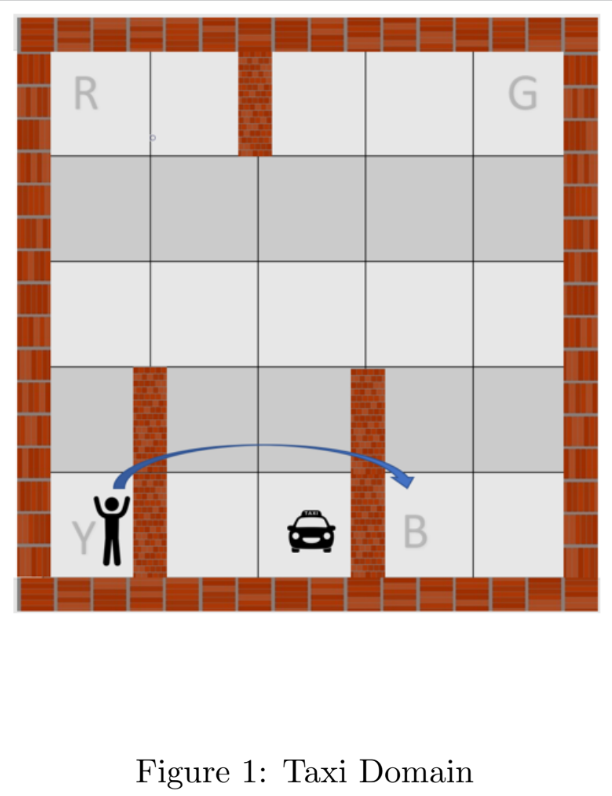

#3 Actions and Options
**Actions:** There are 6 discrete deterministic actions: 0: move south; 1: move north; 2: move east; 3: move west; 4: pick passenger up; and 5: drop passenger off.


**Options:** Options to move the taxi to each of the four designated locations, executable when the taxi is not already there.


You will be experimenting with OpenAI Gym’s Taxi-v3 environment.

# 4 Tasks
First, implement the single step **SMDP Q-learning** for solving the taxi problem. A rough sketch of the algorithm is as follows: Given the set of options,

- Execute the current selected option to termination (e.g. use epsilon greedy $Q(s, o))$.
- Computer $r(s, o)$.
- Update $Q(st, o)$.

Second, implement **intra-option Q-Learning** on the same environment.


For each algorithm, do the following (only for the configuration with the best hyperparameters):

1. Plot reward curves and visualize the learned Q-values.
2. Provide a written description of the policies learnt and your reasoning behind why
the respective algorithm learns the policy.

3. Is there an alternate set of options that you can use to solve this problem, such that this set and the given options to move the taxi are mutually exclusive? If so, run both algorithms with this alternate set of options and compare performance with the algorithms run on the options to move the taxi.


Finally, provide a comparison between the SMDP Q-Learning and intra-option Q-Learning algorithms. Do you observe any improvement with intra-option Q-Learning? If so, describe why this happens as well. Please make sure that all descriptions are brief and to the point.

In [217]:
import numpy as np
import gym
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import product

# Initialize the Taxi-v3 environment
env = gym.make('Taxi-v3')

# Hyperparameters to tune
alpha_list = [0.1]
gamma_list = [0.9] 
epsilon_list = [0.1, 0.2, 0.3] 
num_episodes = 3000

In [218]:
# Function to Choose an action using epsilon-greedy strategy
def choose_action(state, Q, epsilon):
    if np.random.uniform(0, 1) < epsilon:
        return env.action_space.sample()  # Explore: random action
    else:
        return np.argmax(Q[state])  # Exploit: best action based on Q

In [219]:
#SMDP Q-Learning Algorithm
def smdp_q_learning(env, alpha, gamma, epsilon, num_episodes):
    Q = np.zeros((env.observation_space.n, env.action_space.n))
    rewards = []
    for _ in range(num_episodes):
        state = env.reset()[0]
        done = False
        total_reward = 0
        while not done:
            action = choose_action(state, Q, epsilon)
            print(env.step(action))
            next_state, reward, done, _, _ = env.step(action)
            total_reward += reward

            Q[state, action] = Q[state, action] + alpha * (reward + gamma * np.max(Q[next_state, :]) - Q[state, action])
            
            state = next_state
        rewards.append(total_reward)
    return Q, rewards

In [220]:
# Intra-Option Q-Learning Algorithm
def intra_option_q_learning(env, alpha, gamma, epsilon, num_episodes):
    Q = np.zeros((env.observation_space.n, env.action_space.n))
    rewards = []
    for _ in range(num_episodes):
        state = env.reset()[0]
        done = False
        total_reward = 0
        while not done:
            action = choose_action(state, Q, epsilon)
            next_state, reward, done, _, _ = env.step(action)
            total_reward += reward
            if done:
                max_next_action_value = np.max(Q[next_state, :])  # Max value of actions in the next state for terminating node
                Q[state, action] += alpha * (reward + gamma * max_next_action_value - Q[state, action])
            else:
                Q[state, action] += alpha * (reward + gamma * Q[next_state, action] - Q[state, action])
            
            state = next_state
        rewards.append(total_reward)
    return Q, rewards


In [221]:
def tune_hyperparameters(env, alg_func, alpha_list, gamma_list, epsilon_list, num_episodes):
    best_avg_reward = -float('inf')
    best_avg_params = None
    best_avg_Q = None
    best_avg_rewards = None

    best_reward = -float('inf')
    best_params = None
    best_Q = None
    best_rewards = None

    for alpha, gamma, epsilon in product(alpha_list, gamma_list, epsilon_list):
        Q, rewards = alg_func(env, alpha, gamma, epsilon, num_episodes)
        avg_reward = np.mean(rewards[-100:])
        last_100_best = np.max(rewards[-100:])
        print(f'Alpha: {alpha}, Gamma: {gamma}, Epsilon: {epsilon}, Avg Reward: {avg_reward}')
        print(f'Alpha: {alpha}, Gamma: {gamma}, Epsilon: {epsilon}, Best Reward: {last_100_best}')
        if avg_reward > best_avg_reward:
            best_avg_reward = avg_reward
            best_avg_params = (alpha, gamma, epsilon)
            best_avg_Q = Q
            best_avg_rewards = rewards
        if last_100_best > best_reward:
            best_reward = avg_reward
            best_params = (alpha, gamma, epsilon)
            best_Q = Q
            best_rewards = rewards
    return best_Q, best_params, best_rewards, best_avg_Q, best_avg_params, best_avg_rewards

In [222]:
def print_trajectory_in_words(trajectory, env, alpha, gamma, epsilon):
    state_action_sequence = []
    for i in range(len(trajectory) - 1):
        state, action = trajectory[i]
        next_state, _ = trajectory[i + 1]
        state_action_sequence.append(f"s{state} -> a{action} -> s{next_state}")
    
    print(f"\nTrajectory for α={alpha}, γ={gamma}, ε={epsilon}:")
    print(" -> ".join(state_action_sequence))

def simulate_and_plot_policy(env, Q, max_steps=100, alpha=None, gamma=None, epsilon=None):
    state = env.reset()[0]
    trajectory = [(state, None)]

    for _ in range(max_steps):
        action = np.argmax(Q[state])
        next_state, reward, done, _, _ = env.step(action)
        trajectory.append((next_state, action))
        state = next_state

        if done:
            break

    print_trajectory_in_words(trajectory, env, alpha, gamma, epsilon)

In [223]:
# Plotting functions
def plot_rewards(rewards, title):
    plt.figure(figsize=(12, 6))
    plt.plot(rewards)
    plt.title(title)
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.show()

def visualize_q_values(Q, title='Q-Values'):
    plt.figure(figsize=(10, 150))
    sns.heatmap(Q, cmap='coolwarm', annot=True, fmt=".2f", linewidths=.5)
    plt.title(title)
    plt.xlabel('Actions')
    plt.ylabel('States')
    plt.show()

In [224]:
# Tune hyperparameters for SMDP Q-Learning
print("Tuning SMDP Q-Learning:")
best_Q_smdp, best_params_smdp, best_rewards_smdp, best_avg_Q_smdp, best_avg_params_smdp, best_avg_rewards_smdp = tune_hyperparameters(env, smdp_q_learning, alpha_list, gamma_list, epsilon_list, num_episodes)

# Tune hyperparameters for Intra-Option Q-Learning
print("Tuning Intra-Option Q-Learning:")
best_Q_intra, best_params_intra, best_rewards_intra, best_avg_Q_intra, best_avg_params_intra, best_avg_rewards_intra = tune_hyperparameters(env, intra_option_q_learning, alpha_list, gamma_list, epsilon_list, num_episodes)

#Best Values 
print(f"SMDP Best:\nBest reward: {best_rewards_smdp}\nBest parameters: Alpha={best_params_smdp[0]}, Gamma={best_params_smdp[1]}, Epsilon={best_params_smdp[2]} \nBest Q value: {best_Q_smdp}")
print(f"Intra-option Best:\nBest reward: {best_rewards_intra}\nBest parameters: Alpha={best_params_intra[0]}, Gamma={best_params_intra[1]}, Epsilon={best_params_intra[2]} \nBest Q value: {best_Q_intra}")

#Best average Values
print(f"SMDP Best Average:\nBest Average reward: {best_avg_rewards_smdp}\nBest Average parameters: Alpha={best_avg_params_smdp[0]}, Gamma={best_avg_params_smdp[1]}, Epsilon={best_avg_params_smdp[2]} \nBest Q value: {best_avg_Q_smdp}")
print(f"Intra-option Best Average:\nBest Average reward: {best_rewards_intra}\nBest Average parameters: Alpha={best_params_intra[0]}, Gamma={best_avg_params_intra[1]}, Epsilon={best_avg_params_intra[2]} \nBest Average Q value: {best_avg_Q_intra}")

Tuning SMDP Q-Learning:


/opt/homebrew/lib/python3.11/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


Alpha: 0.1, Gamma: 0.9, Epsilon: 0.1, Avg Reward: 0.8
Alpha: 0.1, Gamma: 0.9, Epsilon: 0.1, Best Reward: 15
Alpha: 0.1, Gamma: 0.9, Epsilon: 0.2, Avg Reward: -6.39
Alpha: 0.1, Gamma: 0.9, Epsilon: 0.2, Best Reward: 13
Alpha: 0.1, Gamma: 0.9, Epsilon: 0.3, Avg Reward: -15.74
Alpha: 0.1, Gamma: 0.9, Epsilon: 0.3, Best Reward: 12
Tuning Intra-Option Q-Learning:
Alpha: 0.1, Gamma: 0.9, Epsilon: 0.1, Avg Reward: -934.38
Alpha: 0.1, Gamma: 0.9, Epsilon: 0.1, Best Reward: 11
Alpha: 0.1, Gamma: 0.9, Epsilon: 0.2, Avg Reward: -1185.33
Alpha: 0.1, Gamma: 0.9, Epsilon: 0.2, Best Reward: -44
Alpha: 0.1, Gamma: 0.9, Epsilon: 0.3, Avg Reward: -918.49
Alpha: 0.1, Gamma: 0.9, Epsilon: 0.3, Best Reward: 12
SMDP Best:
Best reward: [-1547, -739, -1349, -2336, -1262, -2952, -1196, -4459, -2668, -2240, -772, -789, -1693, -612, -787, -1733, -2271, -1155, -3759, -1424, -1129, -1310, -896, -1217, -293, -1715, -1607, -1095, -426, -577, -1347, -372, -810, -898, -1187, -978, -886, -490, -960, -644, -379, -1148, 

Visualizing Q-values for the best hyperparameters...


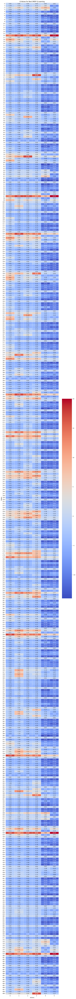

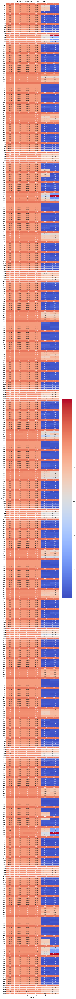

Best Parameters for SMDP Q-Learning: Alpha=0.1, Gamma=0.9, Epsilon=0.3


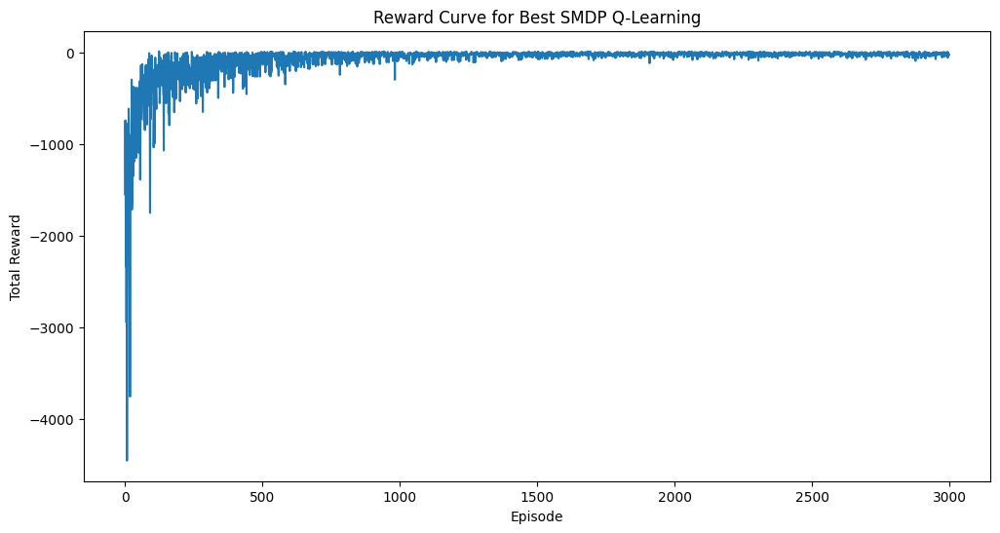

Best Parameters for Intra-Option Q-Learning: Alpha=0.1, Gamma=0.9, Epsilon=0.3


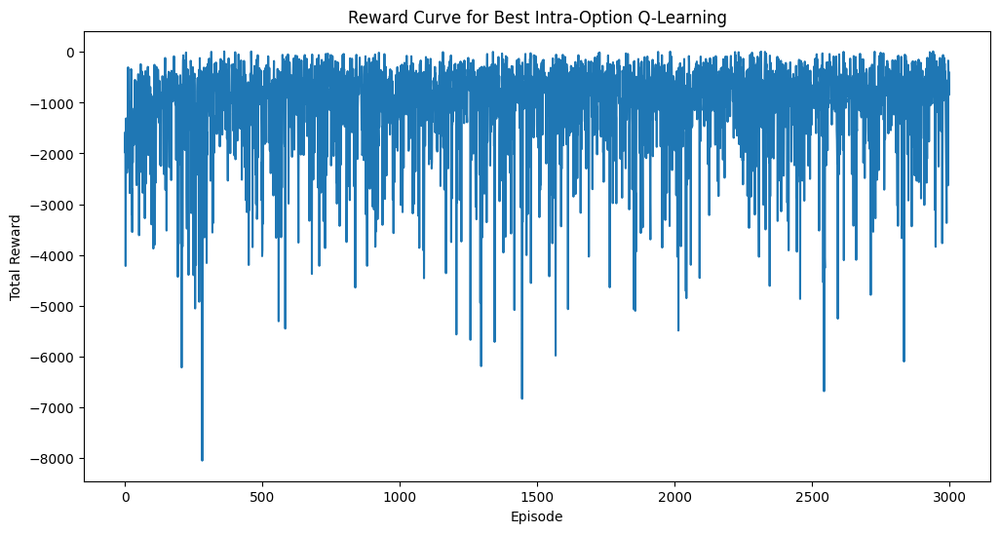

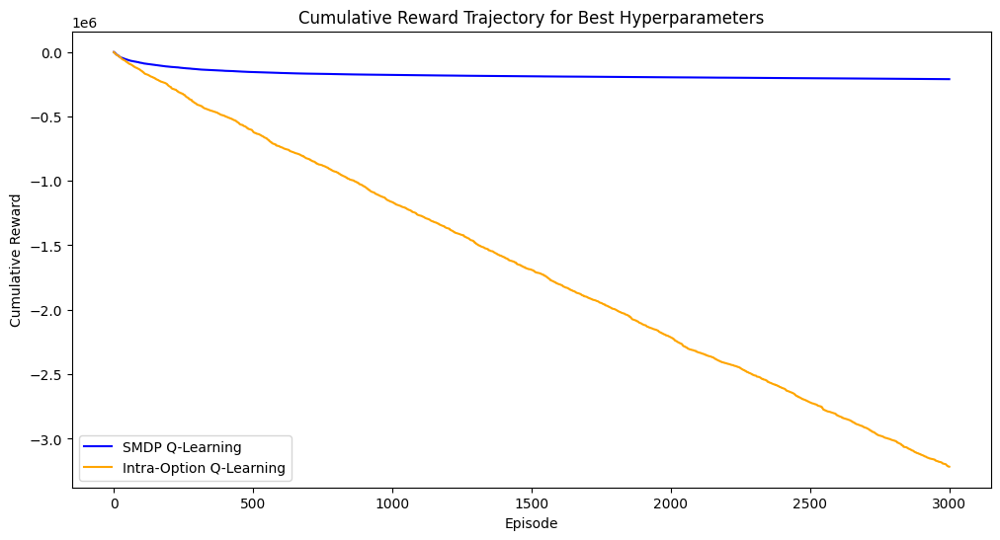

Simulating and printing the policy trajectory for SMDP Q-Learning...

Trajectory for α=0.1, γ=0.9, ε=0.3:
s313 -> aNone -> s213 -> s213 -> a1 -> s233 -> s233 -> a2 -> s253 -> s253 -> a2 -> s273 -> s273 -> a2 -> s373 -> s373 -> a0 -> s473 -> s473 -> a0 -> s477 -> s477 -> a4 -> s377 -> s377 -> a1 -> s277 -> s277 -> a1 -> s297 -> s297 -> a2 -> s197 -> s197 -> a1 -> s97 -> s97 -> a1 -> s85
Simulating and printing the policy trajectory for Intra-Option Q-Learning...

Trajectory for α=0.1, γ=0.9, ε=0.3:
s372 -> aNone -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3 -> s372 -> s372 -> a3

In [225]:
#Best values Visualization

# Visualize the best Q-values for both algorithms
print("Visualizing Q-values for the best hyperparameters...")
visualize_q_values(best_Q_smdp, title='Q-Values for Best SMDP Q-Learning')
visualize_q_values(best_Q_intra, title='Q-Values for Best Intra-Option Q-Learning')

# Plot reward curves for the best hyperparameters
print(f"Best Parameters for SMDP Q-Learning: Alpha={best_params_smdp[0]}, Gamma={best_params_smdp[1]}, Epsilon={best_params_smdp[2]}")
plot_rewards(best_rewards_smdp, 'Reward Curve for Best SMDP Q-Learning')

print(f"Best Parameters for Intra-Option Q-Learning: Alpha={best_params_intra[0]}, Gamma={best_params_intra[1]}, Epsilon={best_params_intra[2]}")
plot_rewards(best_rewards_intra, 'Reward Curve for Best Intra-Option Q-Learning')

# Plotting the trajectory of the best hyperparameters
plt.figure(figsize=(12, 6))
plt.plot(np.cumsum(best_rewards_smdp), label='SMDP Q-Learning', color='blue')
plt.plot(np.cumsum(best_rewards_intra), label='Intra-Option Q-Learning', color='orange')
plt.title('Cumulative Reward Trajectory for Best Hyperparameters')
plt.xlabel('Episode')
plt.ylabel('Cumulative Reward')
plt.legend()
plt.show()

# Simulate and plot the policy trajectory for the best parameters
print("Simulating and printing the policy trajectory for SMDP Q-Learning...")
simulate_and_plot_policy(env, best_Q_smdp, max_steps=100, alpha=best_params_smdp[0], gamma=best_params_smdp[1], epsilon=best_params_smdp[2])

print("Simulating and printing the policy trajectory for Intra-Option Q-Learning...")
simulate_and_plot_policy(env, best_Q_intra, max_steps=100, alpha=best_params_intra[0], gamma=best_params_intra[1], epsilon=best_params_intra[2])

Visualizing Q-values for the best hyperparameters...


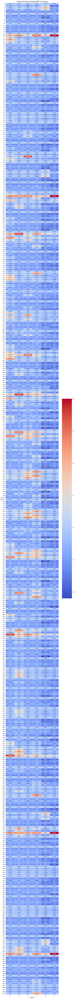

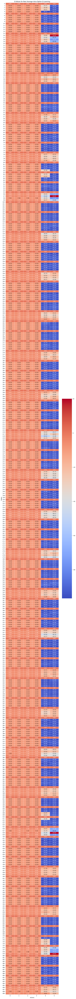

Best Average Parameters for SMDP Q-Learning: Alpha=0.1, Gamma=0.9, Epsilon=0.1


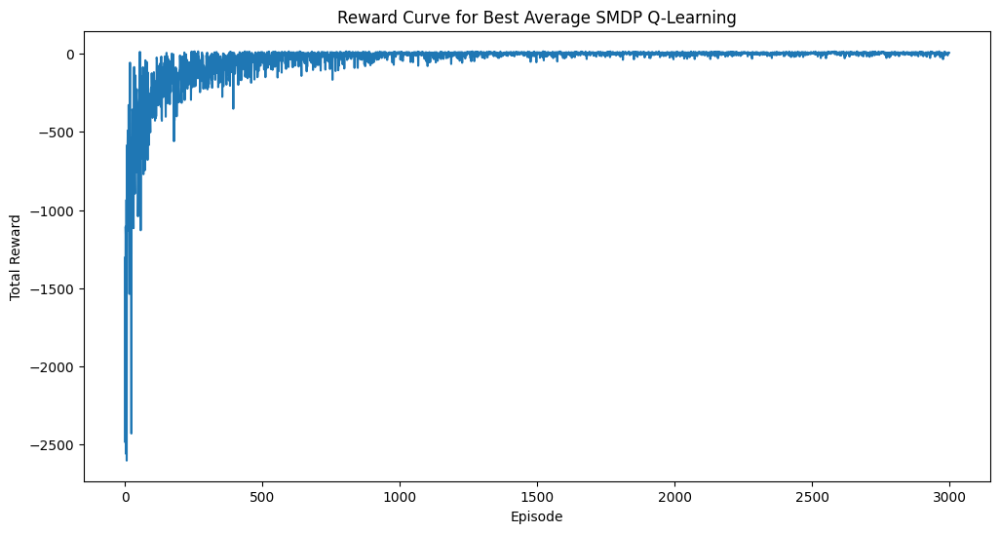

Best Average Parameters for Intra-Option Q-Learning: Alpha=0.1, Gamma=0.9, Epsilon=0.3


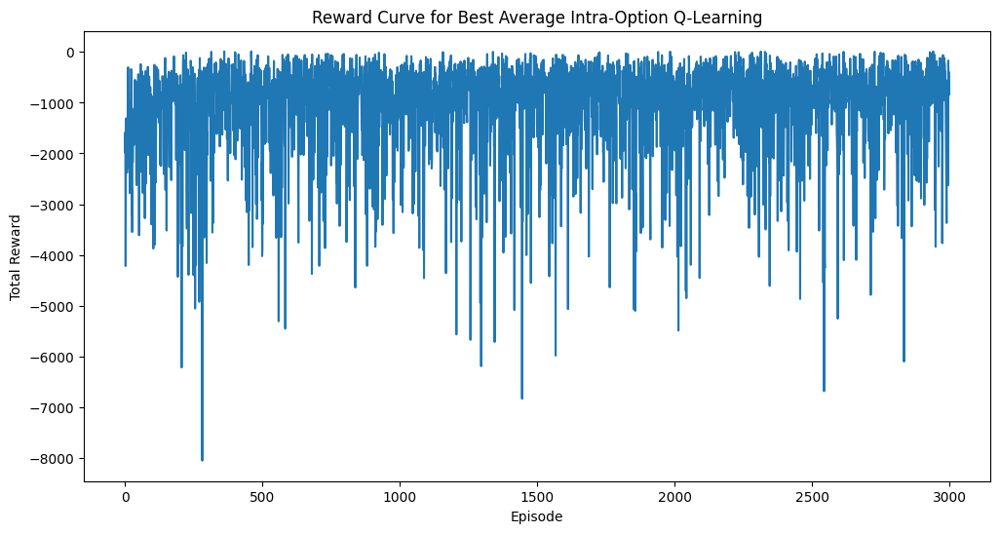

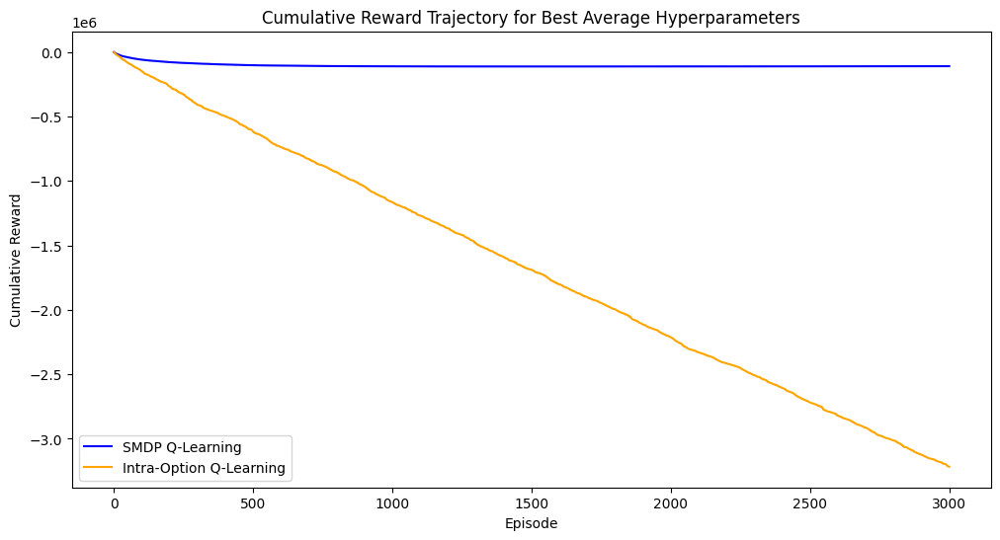

Simulating and printing the policy trajectory for SMDP Q-Learning...

Trajectory for α=0.1, γ=0.9, ε=0.1:
s206 -> aNone -> s226 -> s226 -> a2 -> s246 -> s246 -> a2 -> s266 -> s266 -> a2 -> s286 -> s286 -> a2 -> s186 -> s186 -> a1 -> s86 -> s86 -> a1 -> s98 -> s98 -> a4 -> s78 -> s78 -> a3 -> s178 -> s178 -> a0 -> s278 -> s278 -> a0 -> s258 -> s258 -> a3 -> s238 -> s238 -> a3 -> s218 -> s218 -> a3 -> s318 -> s318 -> a0 -> s418 -> s418 -> a0 -> s410
Simulating and printing the policy trajectory for Intra-Option Q-Learning...

Trajectory for α=0.1, γ=0.9, ε=0.3:
s174 -> aNone -> s154 -> s154 -> a3 -> s54 -> s54 -> a1 -> s74 -> s74 -> a2 -> s74 -> s74 -> a1 -> s74 -> s74 -> a1 -> s74 -> s74 -> a1 -> s74 -> s74 -> a1 -> s74 -> s74 -> a1 -> s74 -> s74 -> a1 -> s74 -> s74 -> a1 -> s74 -> s74 -> a1 -> s74 -> s74 -> a1 -> s74 -> s74 -> a1 -> s74 -> s74 -> a1 -> s74 -> s74 -> a1 -> s74 -> s74 -> a1 -> s74 -> s74 -> a1 -> s74 -> s74 -> a1 -> s74 -> s74 -> a1 -> s74 -> s74 -> a1 -> s74 -> s74 -> a

In [226]:
#Best Average values Visualization

# Visualize the best Q-values for both algorithms
print("Visualizing Q-values for the best hyperparameters...")
visualize_q_values(best_avg_Q_smdp, title='Q-Values for Best Average SMDP Q-Learning')
visualize_q_values(best_avg_Q_intra, title='Q-Values for Best Average Intra-Option Q-Learning')

# Plot reward curves for the best hyperparameters
print(f"Best Average Parameters for SMDP Q-Learning: Alpha={best_avg_params_smdp[0]}, Gamma={best_avg_params_smdp[1]}, Epsilon={best_avg_params_smdp[2]}")
plot_rewards(best_avg_rewards_smdp, 'Reward Curve for Best Average SMDP Q-Learning')

print(f"Best Average Parameters for Intra-Option Q-Learning: Alpha={best_avg_params_intra[0]}, Gamma={best_avg_params_intra[1]}, Epsilon={best_avg_params_intra[2]}")
plot_rewards(best_avg_rewards_intra, 'Reward Curve for Best Average Intra-Option Q-Learning')

# Plotting the trajectory of the best hyperparameters
plt.figure(figsize=(12, 6))
plt.plot(np.cumsum(best_avg_rewards_smdp), label='SMDP Q-Learning', color='blue')
plt.plot(np.cumsum(best_avg_rewards_intra), label='Intra-Option Q-Learning', color='orange')
plt.title('Cumulative Reward Trajectory for Best Average Hyperparameters')
plt.xlabel('Episode')
plt.ylabel('Cumulative Reward')
plt.legend()
plt.show()

# Simulate and plot the policy trajectory for the best parameters
print("Simulating and printing the policy trajectory for SMDP Q-Learning...")
simulate_and_plot_policy(env, best_avg_Q_smdp, max_steps=100, alpha=best_avg_params_smdp[0], gamma=best_avg_params_smdp[1], epsilon=best_avg_params_smdp[2])

print("Simulating and printing the policy trajectory for Intra-Option Q-Learning...")
simulate_and_plot_policy(env, best_avg_Q_intra, max_steps=100, alpha=best_avg_params_intra[0], gamma=best_avg_params_intra[1], epsilon=best_avg_params_intra[2])

In [227]:
print("SMDP Best: ", max(best_rewards_smdp))
print("Intra Best: ", max(best_rewards_intra))

print("SMDP Best Average: ", max(best_avg_rewards_smdp))
print("Intra Best Average: ", max(best_avg_rewards_intra))

SMDP Best:  15
Intra Best:  12
SMDP Best Average:  15
Intra Best Average:  12
